In [1]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import * 
from tensorflow.keras.activations import * 
from tensorflow.keras.models import Sequential
import tensorflow.keras.backend as K
import os
from tqdm import tqdm
import numpy as np
import random
from tensorflow.keras.utils import Sequence
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.model_selection import train_test_split
from tensorflow.keras.metrics import MeanIoU
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from glob import glob


2025-04-21 17:17:23.599518: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745255843.793527      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745255843.853120      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# Load the .npy file
data = np.load('/kaggle/input/floodmapping2/kaggle/working/dataset/input/input_0.npy')

# Print the shape (dimensions)
print("Shape of input_0.npy:", data.shape)


Shape of input_0.npy: (256, 256, 2)


In [3]:
import tensorflow as tf
from tensorflow.keras import layers, Model

def conv_block(x, filters):
    x = layers.Conv2D(filters, 3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, 3, padding="same")(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    return x

def unetpp(input_shape=(256, 256, 3), num_classes=1):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    x00 = conv_block(inputs, 64)
    x10 = layers.MaxPooling2D()(x00)
    x10 = conv_block(x10, 128)
    
    x20 = layers.MaxPooling2D()(x10)
    x20 = conv_block(x20, 256)
    
    x30 = layers.MaxPooling2D()(x20)
    x30 = conv_block(x30, 512)
    
    x40 = layers.MaxPooling2D()(x30)
    x40 = conv_block(x40, 1024)

    # Decoder with nested skip connections
    x01 = conv_block(layers.Concatenate()([x00, layers.UpSampling2D()(x10)]), 64)
    x11 = conv_block(layers.Concatenate()([x10, layers.UpSampling2D()(x20)]), 128)
    x21 = conv_block(layers.Concatenate()([x20, layers.UpSampling2D()(x30)]), 256)
    x31 = conv_block(layers.Concatenate()([x30, layers.UpSampling2D()(x40)]), 512)

    x02 = conv_block(layers.Concatenate()([x00, x01, layers.UpSampling2D()(x11)]), 64)
    x12 = conv_block(layers.Concatenate()([x10, x11, layers.UpSampling2D()(x21)]), 128)
    x22 = conv_block(layers.Concatenate()([x20, x21, layers.UpSampling2D()(x31)]), 256)

    x03 = conv_block(layers.Concatenate()([x00, x01, x02, layers.UpSampling2D()(x12)]), 64)
    x13 = conv_block(layers.Concatenate()([x10, x11, x12, layers.UpSampling2D()(x22)]), 128)

    x04 = conv_block(layers.Concatenate()([x00, x01, x02, x03, layers.UpSampling2D()(x13)]), 64)

    outputs = layers.Conv2D(num_classes, 1, activation='sigmoid')(x04)

    return Model(inputs, outputs)

In [4]:
model = unetpp(input_shape=(256, 256, 3), num_classes=1)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
model.summary()

I0000 00:00:1745255857.134586      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13942 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5
I0000 00:00:1745255857.135315      31 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 13942 MB memory:  -> device: 1, name: Tesla T4, pci bus id: 0000:00:05.0, compute capability: 7.5


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 256, 256, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 256, 256, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ re_lu_1[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 128, 128, 128)  │            512 │ conv2d_2[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 128, 128, 128)  │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 128, 128, 128)  │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_3 (ReLU)            │ (None, 128, 128, 128)  │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ re_lu_3[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_4

 Total params: 36,644,225 (139.79 MB)

 Trainable params: 36,629,633 (139.73 MB)

 Non-trainable params: 14,592 (57.00 KB)

In [5]:
input_files = sorted(glob('/kaggle/input/floodmapping2/kaggle/working/dataset/input/*.npy'))
target_files = sorted(glob('/kaggle/input/floodmapping2/kaggle/working/dataset/target/*.npy'))

def load_npy_pair(input_path, target_path):
    # Load the input and target .npy files
    input_array = np.load(input_path.decode()).astype(np.float32)  # shape: (256, 256, 2)
    target_array = np.load(target_path.decode()).astype(np.float32)  # shape: (256, 256, 1)
    
    # Calculate 3rd channel = input[..., 0] - input[..., 1]
    diff_channel = np.expand_dims(input_array[..., 0] - input_array[..., 1], axis=-1)  # shape: (256, 256, 1)

    # Concatenate to form (256, 256, 3)
    input_array = np.concatenate([input_array, diff_channel], axis=-1)

    return input_array, target_array

def tf_load_npy(input_path, target_path):
    input_img, target_img = tf.numpy_function(
        load_npy_pair, [input_path, target_path], [tf.float32, tf.float32])
    input_img.set_shape([256, 256, 3])  # Now 3 channels
    target_img.set_shape([256, 256, 1])
    return input_img, target_img

def augment_image(input_img, target_img):
    # Random flip left-right
    flip_lr = tf.random.uniform(()) > 0.5
    input_img = tf.cond(flip_lr, lambda: tf.image.flip_left_right(input_img), lambda: input_img)
    target_img = tf.cond(flip_lr, lambda: tf.image.flip_left_right(target_img), lambda: target_img)

    # Random flip up-down
    flip_ud = tf.random.uniform(()) > 0.5
    input_img = tf.cond(flip_ud, lambda: tf.image.flip_up_down(input_img), lambda: input_img)
    target_img = tf.cond(flip_ud, lambda: tf.image.flip_up_down(target_img), lambda: target_img)

    # Random rotation (0, 90, 180, 270 degrees)
    k = tf.random.uniform((), minval=0, maxval=4, dtype=tf.int32)
    input_img = tf.image.rot90(input_img, k)
    target_img = tf.image.rot90(target_img, k)

    return input_img, target_img


def make_dataset(input_paths, target_paths, batch_size=8, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((input_paths, target_paths))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=len(input_paths))
    dataset = dataset.map(tf_load_npy, num_parallel_calls=tf.data.AUTOTUNE)
    
    # Apply augmentations
    dataset = dataset.map(lambda x, y: augment_image(x, y), num_parallel_calls=tf.data.AUTOTUNE)

    dataset = dataset.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return dataset

train_ds = make_dataset(input_files, target_files)

In [6]:
def generate_images(model, input_image, target, step):
    """
    Generates and saves visual comparison between inputs, ground truth, and model prediction.
    
    Args:
        model: Trained segmentation model.
        input_image: A batch of input images (e.g., shape [1, 256, 256, 3]).
        target: Ground truth masks (e.g., shape [1, 256, 256, 1]).
        step: An integer step/epoch for saving output images.
    """
    prediction = model(input_image, training=False)

    plt.figure(figsize=(15, 5))

    display_list = [
        input_image[0, :, :, 0],  # Before image (channel 1)
        input_image[0, :, :, 1],  # After image (channel 2)
        input_image[0, :, :, 2],  # Difference (before - after)
        tf.squeeze(target[0], axis=-1),  # Ground truth mask
        tf.squeeze(prediction[0], axis=-1)  # Model prediction
    ]

    titles = ['Input (ch 1)', 'Input (ch 2)', 'Diff (ch 3)', 'Target', 'Prediction']

    for i in range(5):
        plt.subplot(1, 5, i + 1)
        plt.title(titles[i])
        plt.imshow(display_list[i], cmap='gray')
        plt.axis('off')

    plt.tight_layout()
    plt.savefig(f"sample_step_{step}.png")
    plt.show()

class DisplayCallback(tf.keras.callbacks.Callback):
    def __init__(self, dataset, model):
        super().__init__()
        self.dataset = dataset
        self.model_ref = model

    def on_epoch_end(self, epoch, logs=None):
        for input_image, target in self.dataset.take(1):  # take one sample batch
            generate_images(self.model_ref, input_image, target, step=epoch)
            break


In [7]:
model = unetpp(input_shape=(256, 256, 3), num_classes=1)

# Optional: Combine Binary Crossentropy + Dice Loss
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true = tf.reshape(y_true, [-1])
    y_pred = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true * y_pred)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def combo_loss(y_true, y_pred):
    bce = tf.keras.losses.binary_crossentropy(y_true, y_pred)
    return bce + dice_loss(y_true, y_pred)

model.compile(optimizer='adam', loss=combo_loss, metrics=['accuracy'])



Epoch 1/20


I0000 00:00:1745255903.776378      98 service.cc:148] XLA service 0x7b6c38001540 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745255903.777405      98 service.cc:156]   StreamExecutor device (0): Tesla T4, Compute Capability 7.5
I0000 00:00:1745255903.777418      98 service.cc:156]   StreamExecutor device (1): Tesla T4, Compute Capability 7.5
I0000 00:00:1745255906.479134      98 cuda_dnn.cc:529] Loaded cuDNN version 90300
2025-04-21 17:18:32.008947: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng12{k11=0} for conv (f32[8,128,128,128]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,128,128,128]{3,2,1,0}, f32[128,128,3,3]{3,2,1,0}, f32[128]{0}), window={size=3x3 pad=1_1x1_1}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"leakyrelu_alpha":0,"side_input_scale":0},"force_earliest_s

110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.7894 - loss: 1.2072

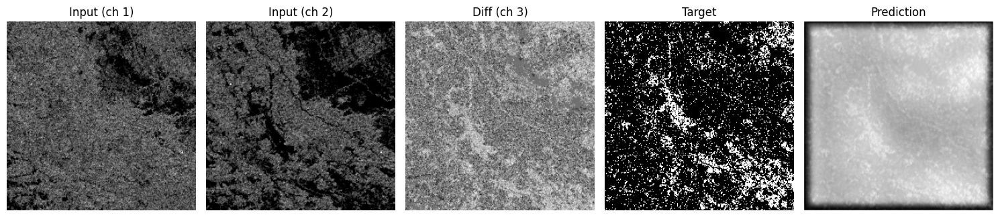

110/110 ━━━━━━━━━━━━━━━━━━━━ 318s 2s/step - accuracy: 0.7896 - loss: 1.2066
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8355 - loss: 1.0454

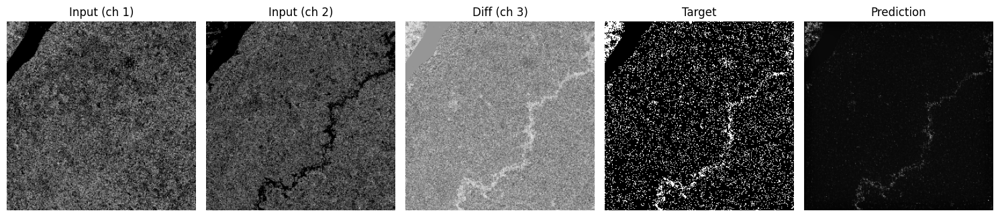

110/110 ━━━━━━━━━━━━━━━━━━━━ 164s 1s/step - accuracy: 0.8355 - loss: 1.0453
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8450 - loss: 1.0110

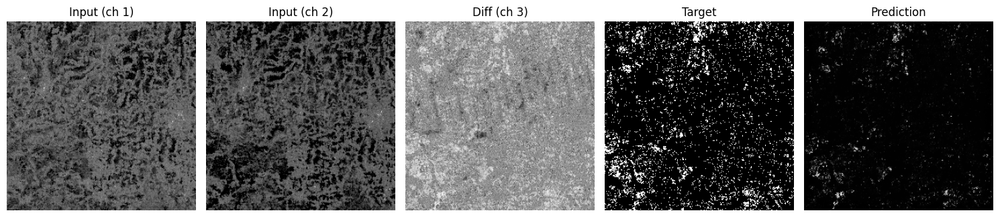

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 1s/step - accuracy: 0.8450 - loss: 1.0109
Epoch 4/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8488 - loss: 0.9867

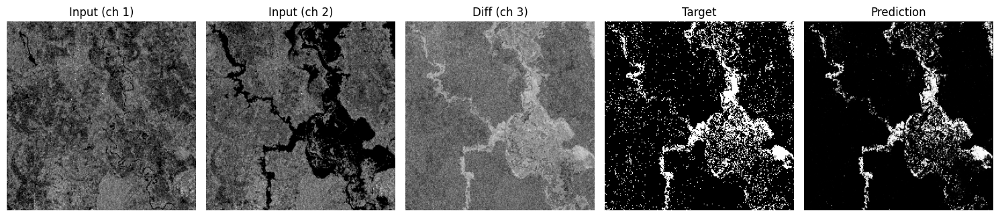

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 1s/step - accuracy: 0.8488 - loss: 0.9867
Epoch 5/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8470 - loss: 0.9940

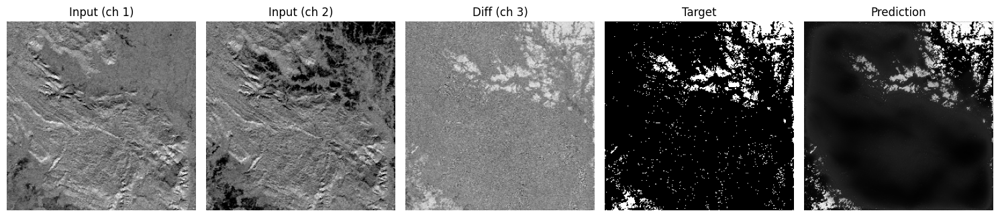

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 1s/step - accuracy: 0.8471 - loss: 0.9938
Epoch 6/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8466 - loss: 0.9875

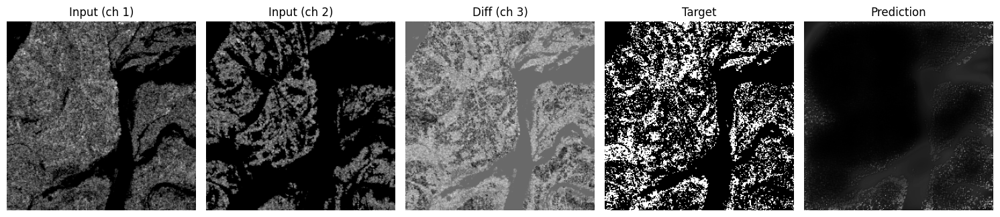

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.8467 - loss: 0.9872
Epoch 7/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8532 - loss: 0.9566

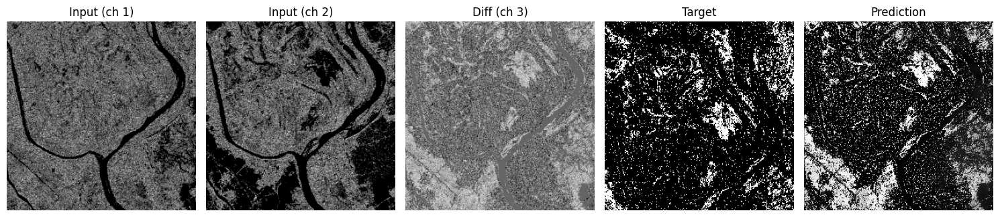

110/110 ━━━━━━━━━━━━━━━━━━━━ 164s 1s/step - accuracy: 0.8533 - loss: 0.9566
Epoch 8/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8572 - loss: 0.9388

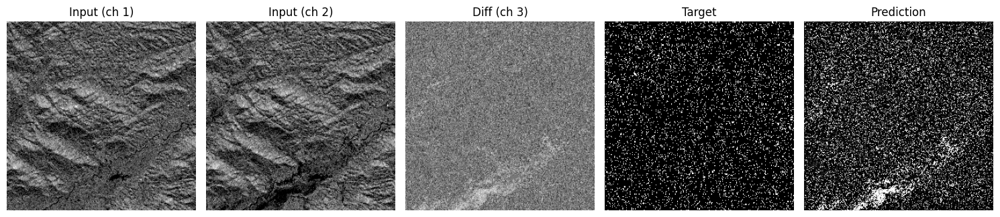

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 1s/step - accuracy: 0.8572 - loss: 0.9390
Epoch 9/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8601 - loss: 0.9361

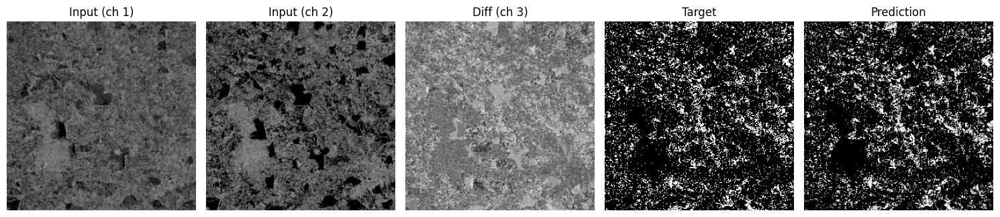

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.8601 - loss: 0.9362
Epoch 10/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8561 - loss: 0.9492

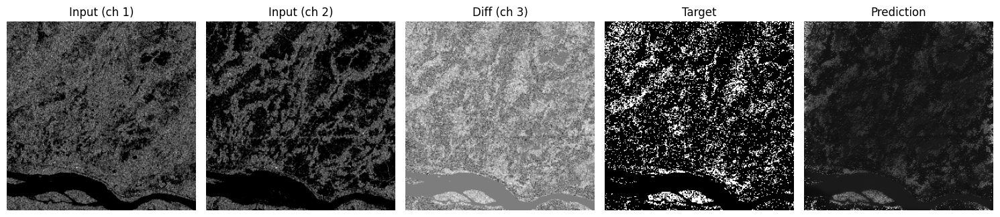

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 1s/step - accuracy: 0.8561 - loss: 0.9490
Epoch 11/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8618 - loss: 0.9394

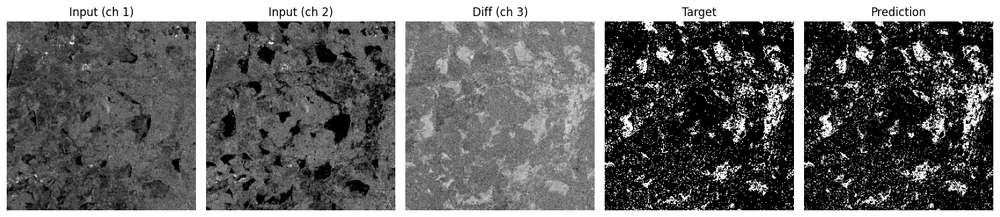

110/110 ━━━━━━━━━━━━━━━━━━━━ 164s 1s/step - accuracy: 0.8618 - loss: 0.9391
Epoch 12/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8685 - loss: 0.8898

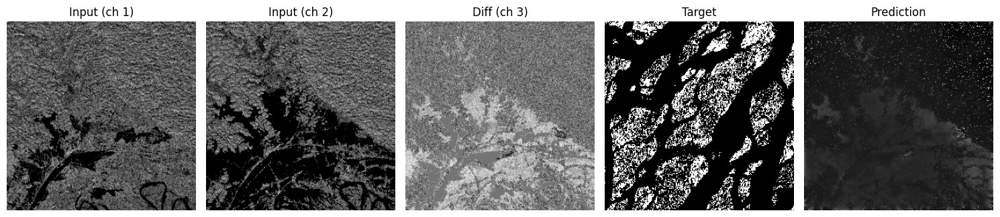

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.8685 - loss: 0.8901
Epoch 13/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8629 - loss: 0.9262

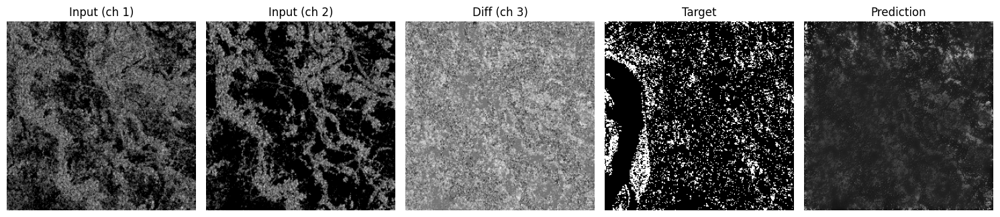

110/110 ━━━━━━━━━━━━━━━━━━━━ 164s 1s/step - accuracy: 0.8630 - loss: 0.9261
Epoch 14/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8652 - loss: 0.9224

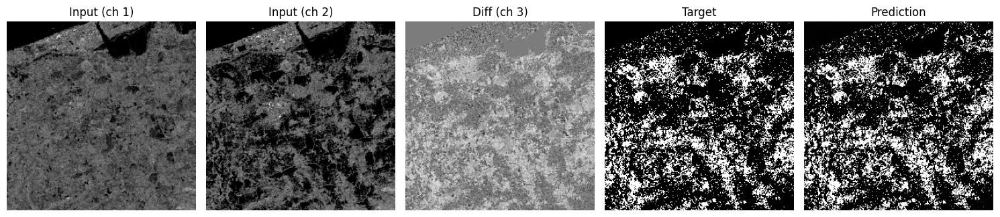

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 1s/step - accuracy: 0.8652 - loss: 0.9222
Epoch 15/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8627 - loss: 0.9256

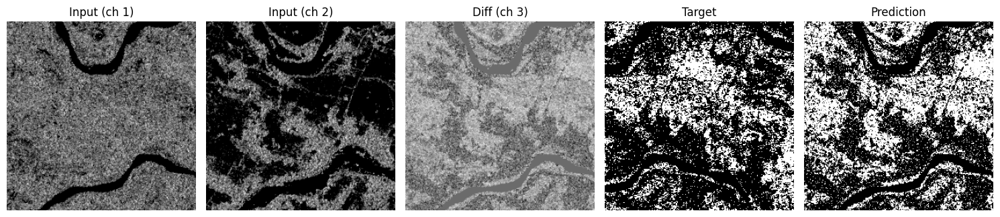

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.8628 - loss: 0.9253
Epoch 16/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8695 - loss: 0.8881

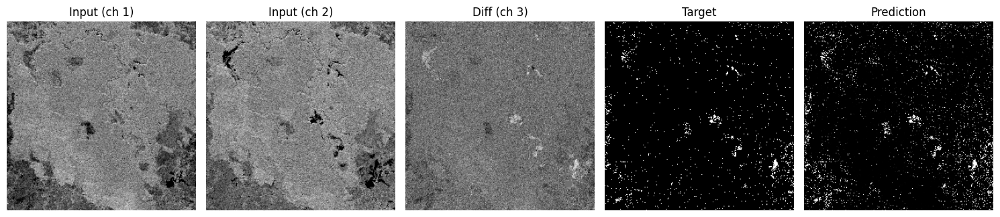

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.8695 - loss: 0.8881
Epoch 17/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8747 - loss: 0.8682

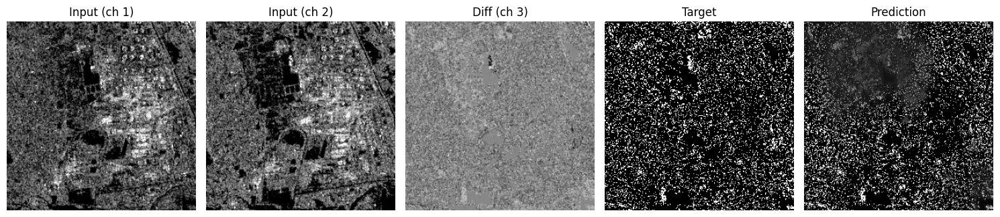

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.8746 - loss: 0.8684
Epoch 18/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8671 - loss: 0.9059

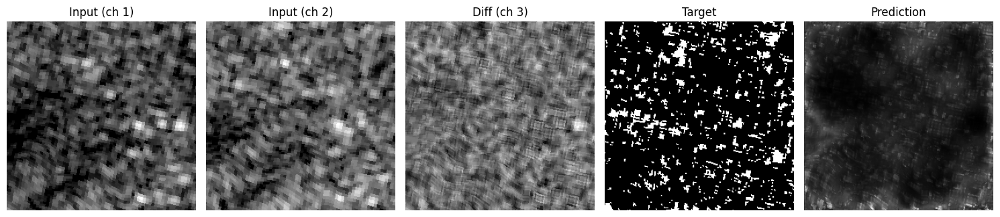

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.8672 - loss: 0.9058
Epoch 19/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8707 - loss: 0.8919

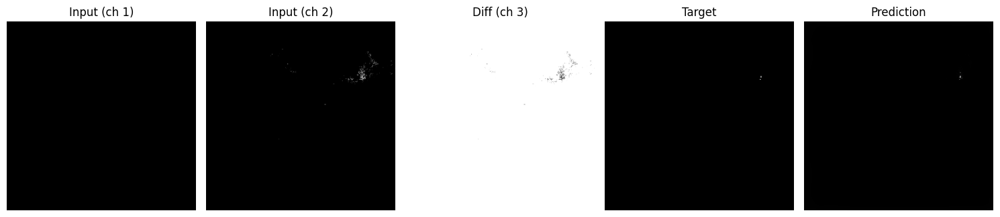

110/110 ━━━━━━━━━━━━━━━━━━━━ 166s 2s/step - accuracy: 0.8707 - loss: 0.8919
Epoch 20/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.8715 - loss: 0.8837

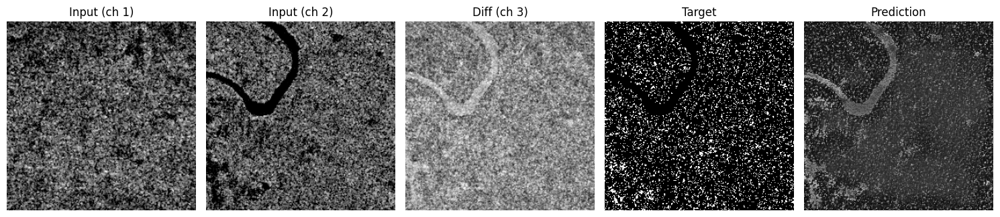

110/110 ━━━━━━━━━━━━━━━━━━━━ 165s 2s/step - accuracy: 0.8715 - loss: 0.8836


In [8]:
EPOCHS = 20

display_cb = DisplayCallback(train_ds, model)

history = model.fit(
    train_ds,
    epochs=EPOCHS,
    callbacks=[display_cb]
)

In [10]:
model.save("unetpp_final.keras")